In [69]:
import dill
import pickle
import numpy as np
import pandas as pd
import cv2
import matplotlib
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
import glob
import os
import pdb
#import ipynb.fs.full.AnglesFuncs as af

In [70]:
#--------------------------------------------------------------
def FindThreshold(FFT, alpha):
    TH = np.mean(FFT)
    ref = 0.1
    totAmp = np.sum(FFT)
    diff = 100
    i = 0
    
    while ((np.abs(diff) > ref) | (i < 100)):
        _, thresh = cv2.threshold(FFT, TH, 1,
                                  cv2.THRESH_BINARY)
        relAmp = np.sum(FFT*thresh)
        # number of bins over the TH
        n = np.sum(thresh)
        diff = (alpha*totAmp - relAmp) / n
        
        TH += (-1 * diff /50)
        i += 1
        
    return TH

#--------------------------------------------------------------
def draw_vector(img, v0, v1):
    cv2.line(img, v0, v1, (0,255,0),10)
    #ax = ax or plt.gca()
    #arrowprops=dict(arrowstyle='->',linewidth=2,shrinkA=0, shrinkB=0)
    #ax.annotate('', v1, v0, arrowprops=arrowprops)

#--------------------------------------------------------------
def find_main_component_dft(item, th):
    # item: address of the image
    # th: Threshold
    # figAddress: address of the figure folder
    figfolder = "figures/"
    
    # extracting info from the name
    idx = [i for i in range(len(item)) if item[i] == '/']
    folder = item[0:np.max(idx)+1]
    name = item[np.max(idx)+1:-4]
    
    image = cv2.imread(item)
    
    # dft and mag
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    dftIm = cv2.dft(np.float32(image),flags = cv2.DFT_COMPLEX_OUTPUT)
    dftImShift = np.fft.fftshift(dftIm)
    magIm = 20*np.log(cv2.magnitude(dftImShift[:,:,0],dftImShift[:,:,1]))
    
    size_img = image.shape
    
    # plot gray image
    plt.figure(figsize=(20,12))
    plt.imshow(image, cmap = 'gray')
    plt.title('Original Image', fontsize=25)
    plt.xlabel('x', fontsize=20)
    plt.ylabel('y', fontsize=20)
    plt.xticks()
    plt.yticks()
    plt.savefig(folder + figfolder + name + '_gry.png')
    
    # plot magnitude
    plt.figure(figsize=(20,12.3))
    plt.imshow(magIm, cmap = 'gray')
    plt.axis('equal')
    plt.title('Magnitude of FT', fontsize=25)
    plt.xlabel('$\omega_x$', fontsize=20)
    plt.ylabel('$\omega_y$', fontsize=20)
    plt.colorbar()
    plt.savefig(folder + figfolder + name + '_mag.png')
    
    # Threshold
    #selection of magnitudes for biary picture: if the element in magIm >= maxMag/5*th => element = maxMag,
    # else is 0.
    maxMag = np.max(magIm)
    TH = FindThreshold(magIm, 1/20)
    ret, thresh = cv2.threshold(magIm, TH, maxMag, \
                                cv2.THRESH_BINARY)
    
    # Principal Component Analysis
    y,x = np.where(thresh == np.max(thresh))
    y = -y
    X = np.ones((len(x),2))
    X[:,0] = x; X[:,1] = y
    pca = PCA(n_components=2)
    pca.fit(X)
    
    # converting from gray to color (because we need it in black
    # and white. very tricky)
    thresh = cv2.cvtColor(thresh, cv2.COLOR_GRAY2RGB)
    
    # drawing vectors of components on threshold
    for sigma, direction in zip(pca.explained_variance_, pca.components_):
        v = direction.T * 2 * np.sqrt(sigma)
        zero = [np.mean(x), np.mean(y)]
        #draw_vector(thresh, zero, zero - v)
        v0 = np.abs(zero)
        v0 = v0.astype(int)
        v1 = np.abs(zero-v)
        v1 = v1.astype(int)
        cv2.line(thresh, (v0[0], v0[1]), (v1[0], v1[1]), (255,0,0),10)
        
    plt.axis('equal');
    
    # Plot Threshold
    plt.figure(figsize=(20,15.4))
    plt.imshow(thresh)
    plt.axis('equal')
    plt.title('Magnitude Binary', fontsize=25)
    plt.xlabel('$\omega_x$', fontsize=20)
    plt.ylabel('$\omega_y$', fontsize=20)
    plt.xticks()
    plt.yticks()
    plt.grid(0)
    plt.savefig(folder + figfolder + name + '_thr.png')
    
    #vec = fig.add_subplot(224)
    #vec.scatter(x,y)
    #plt.title('Magnitude Binary Scatter', fontsize=25)
    #plt.xlabel('$\omega_x$', fontsize=20)
    #plt.ylabel('$\omega_y$', fontsize=20)
    #plt.ylim([0.0, size_img[0]])
    #plt.xlim([0.0, size_img[1]])
    #plt.gca().set_aspect('equal', adjustable='box')
    
        
    left  = 0.0  # the left side of the subplots of the figure
    right = 1.5    # the right side of the subplots of the figure
    bottom = 0.1   # the bottom of the subplots of the figure
    top = 1  # the top of the subplots of the figure
    wspace = 0.5   # the amount of width reserved for space between subplots,
               # expressed as a fraction of the average axis width
    hspace = 0.3   # the amount of height reserved for space between subplots,
               # expressed as a fraction of the average axis height
    # plt.subplots_adjust(left, bottom, right, top, wspace, hspace)
    
    sigma = np.sqrt(pca.explained_variance_)
    
    print('''The angle between the main component and the horizontal is 
        \u03B1 = %2.3f \n''' % (np.arctan(pca.components_[0,1]/pca.components_[0,0])\
         /np.pi/2 * 360))
    print('''The angle between the second component and the horizontal is 
        \u03B2 = %2.3f \n''' % (np.arctan(-pca.components_[1,1]/pca.components_[1,0])\
         /np.pi/2 * 360))
    # pca.explained_variance_[0] = variance along pricipal comp
    # pca.explained_variance_[1] = variance along ortogonal comp
    print("The alignment factor is: %.3g" %  (sigma[1]/sigma[0]))
    
    return (sigma[1]/sigma[0]), plt.show()

For_ANALYSIS/HMB_CB/HMB_CB_sample2.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The angle between the main component and the horizontal is 
        α = 2.013 

The angle between the second component and the horizontal is 
        β = 87.987 

The alignment factor is: 0.824


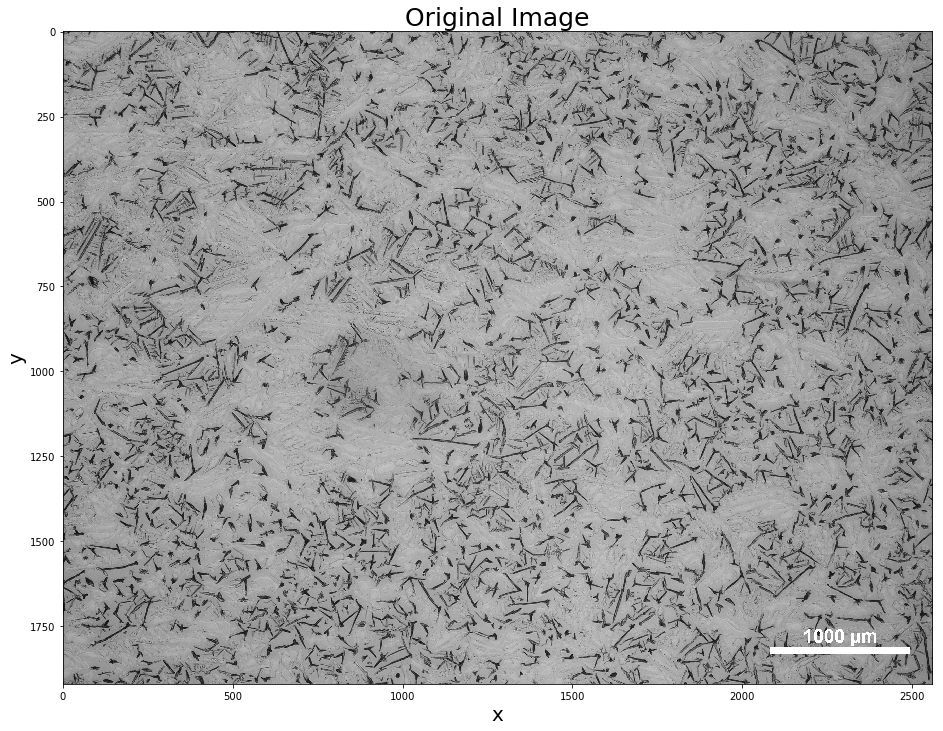

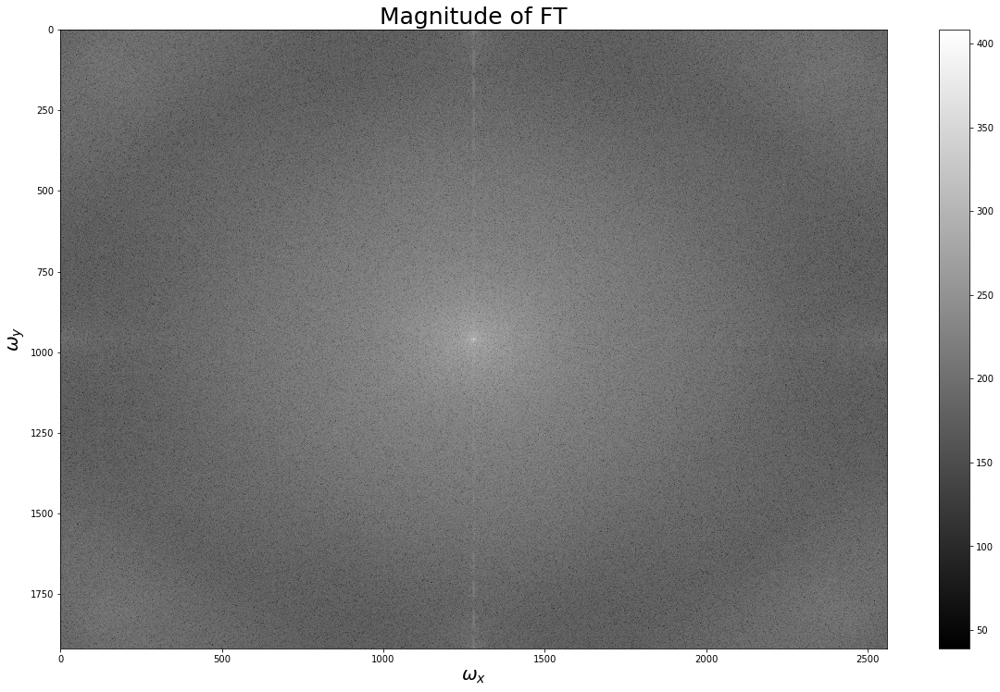

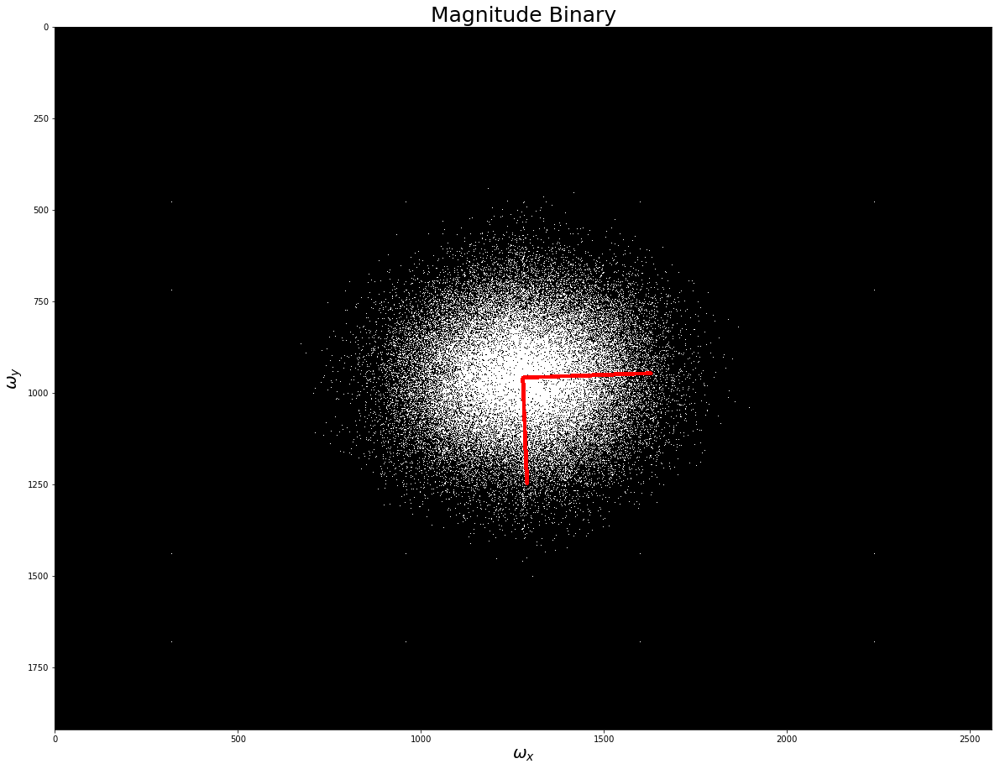

For_ANALYSIS/HMB_CB/HMB_CB_sample3.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The angle between the main component and the horizontal is 
        α = -1.112 

The angle between the second component and the horizontal is 
        β = -88.888 

The alignment factor is: 0.823


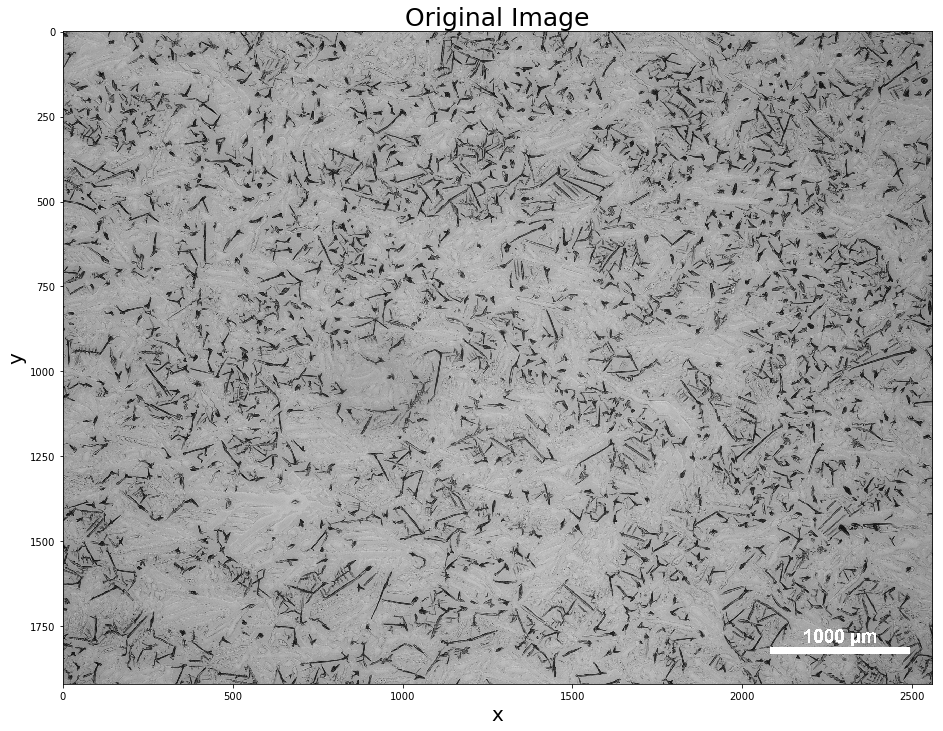

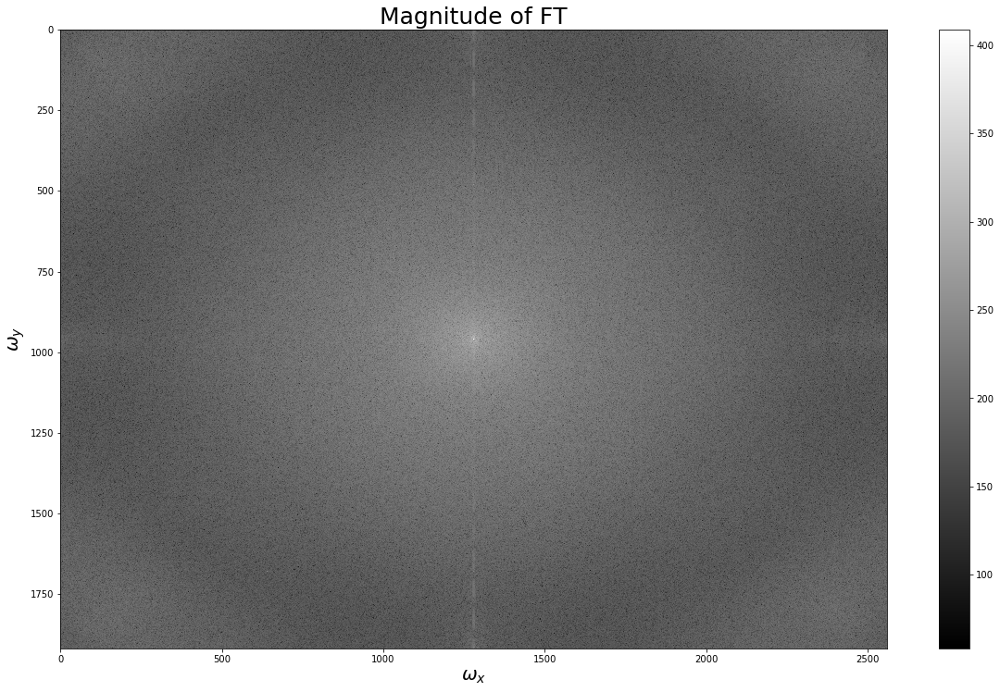

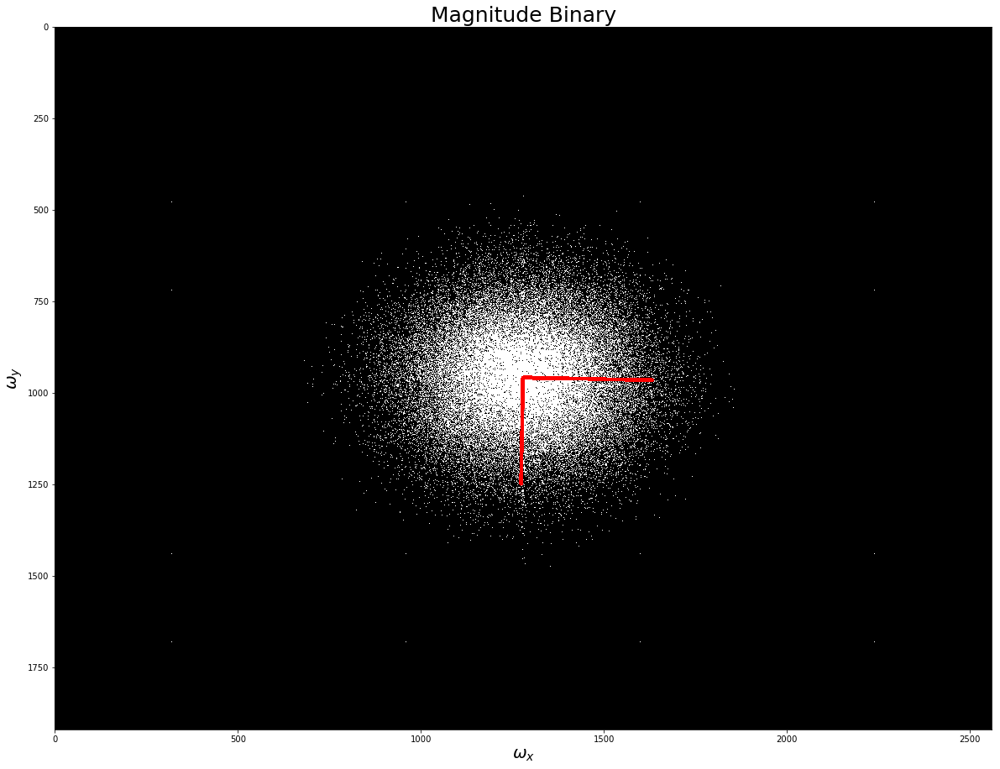

For_ANALYSIS/HMB_CB/HMB_CB_sample1.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The angle between the main component and the horizontal is 
        α = 8.395 

The angle between the second component and the horizontal is 
        β = 81.605 

The alignment factor is: 0.794


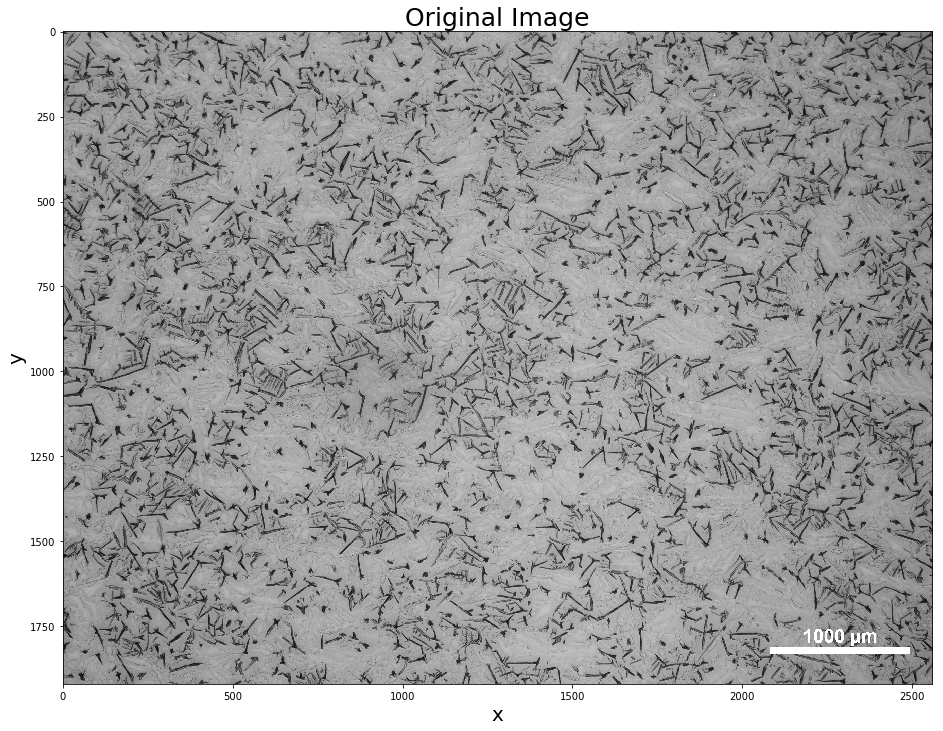

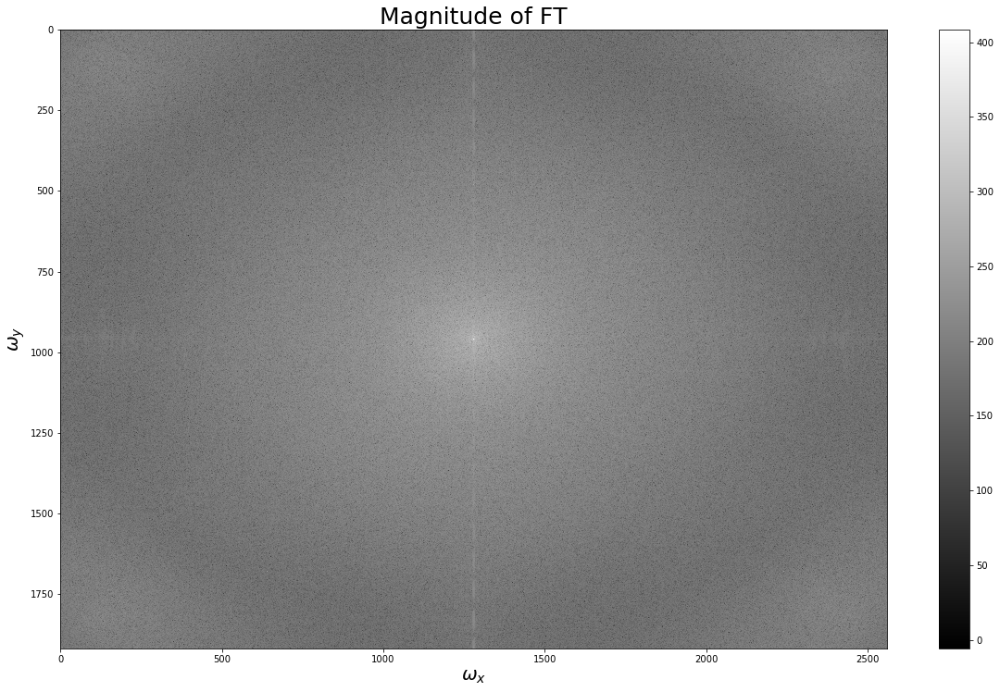

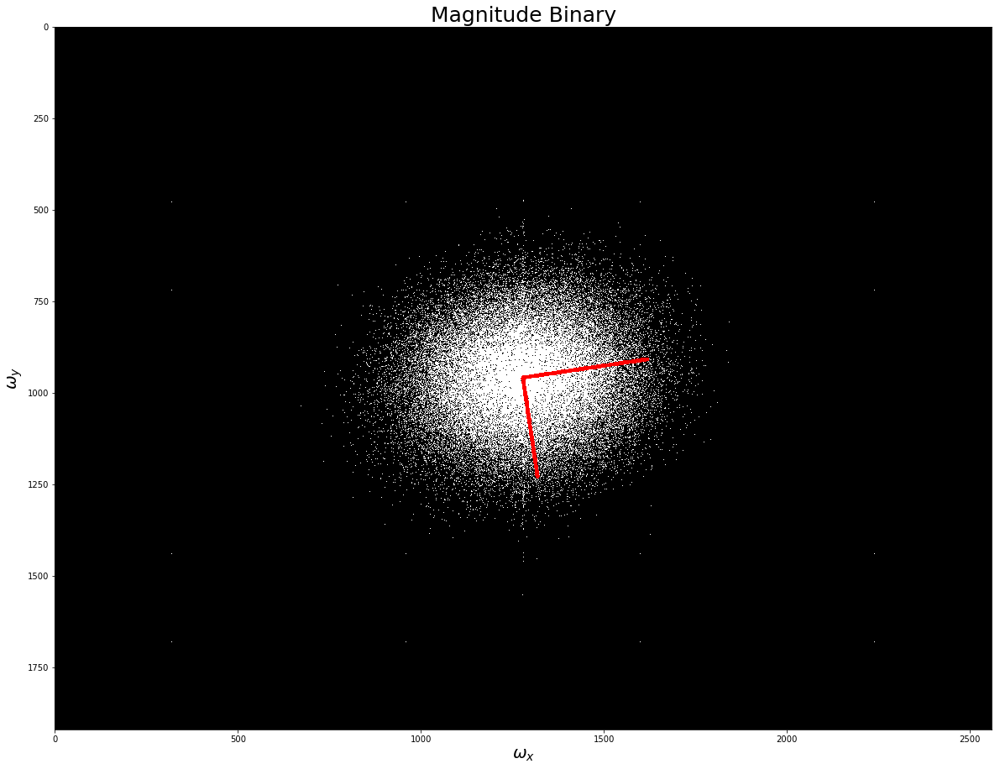

For_ANALYSIS/HMB_CB/HMB_CB_sample4.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The angle between the main component and the horizontal is 
        α = -0.620 

The angle between the second component and the horizontal is 
        β = -89.380 

The alignment factor is: 0.811


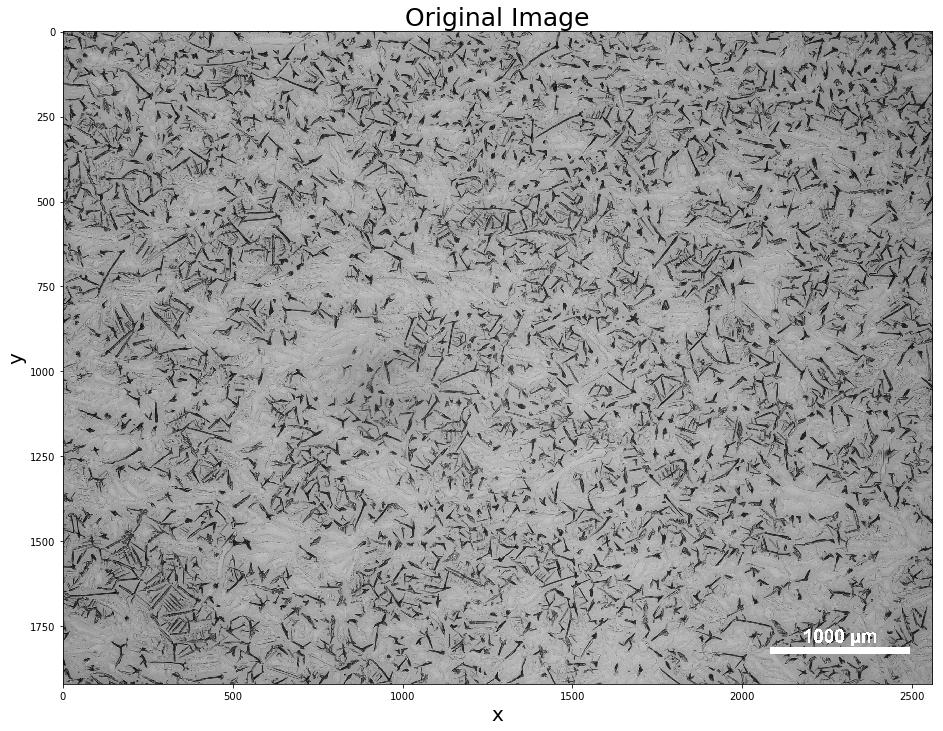

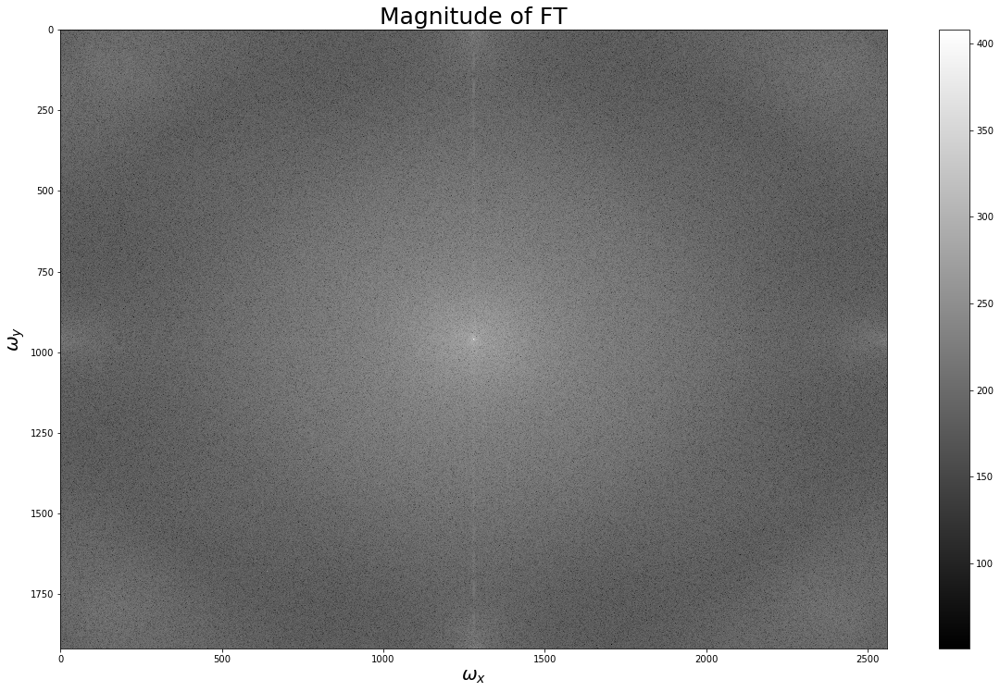

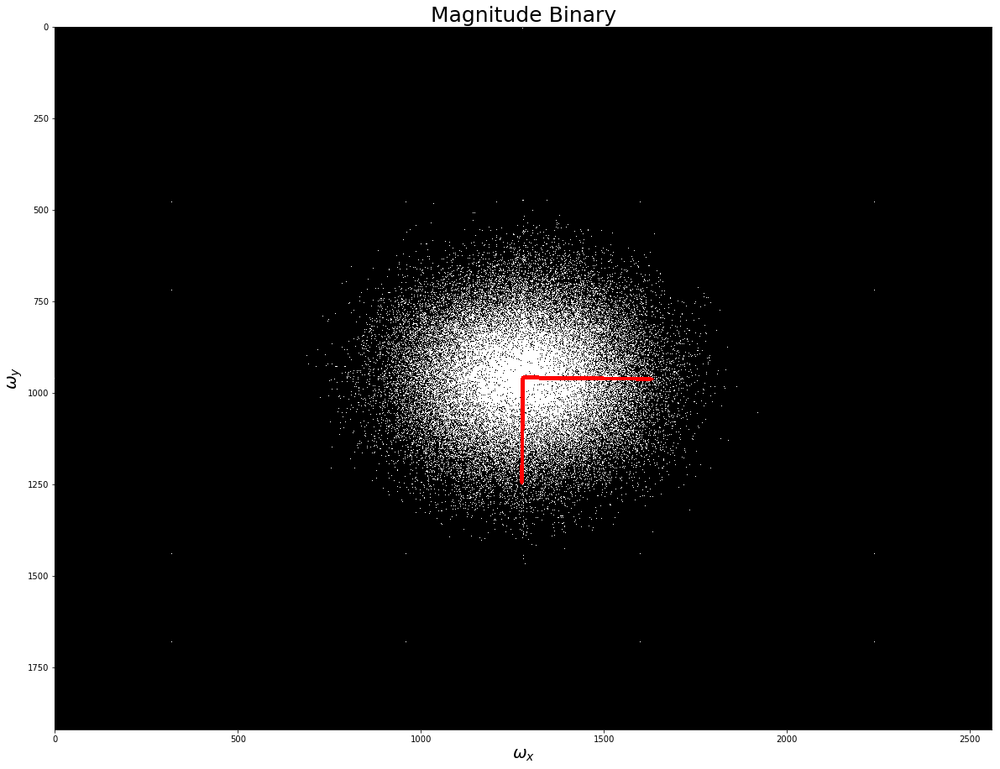

For_ANALYSIS/HMB_CB/HMB_CB_sample5.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The angle between the main component and the horizontal is 
        α = -1.716 

The angle between the second component and the horizontal is 
        β = -88.284 

The alignment factor is: 0.777


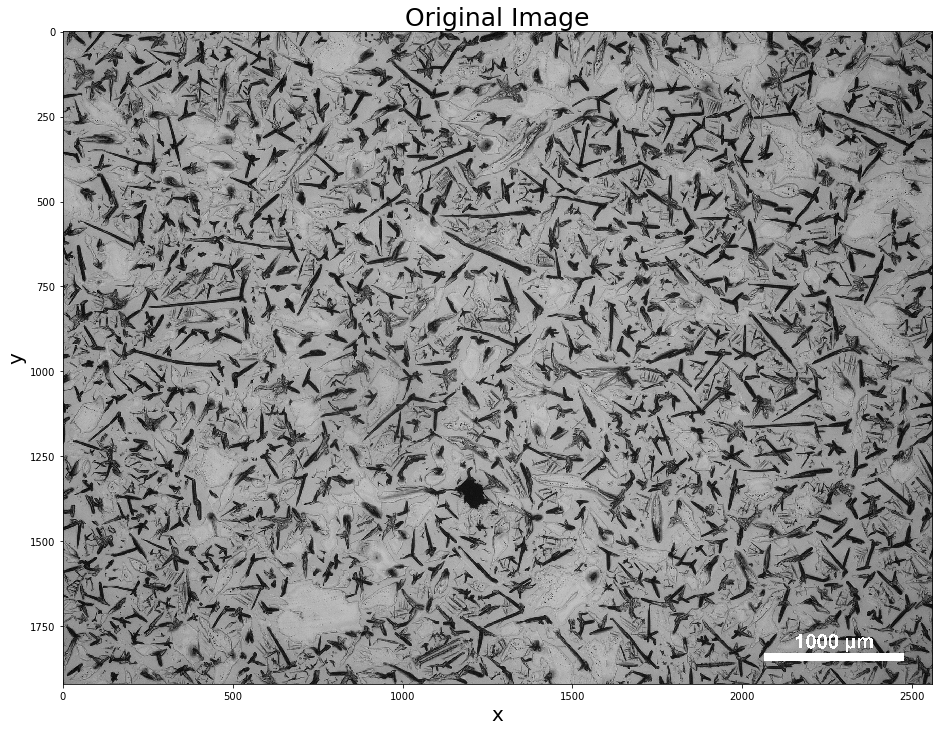

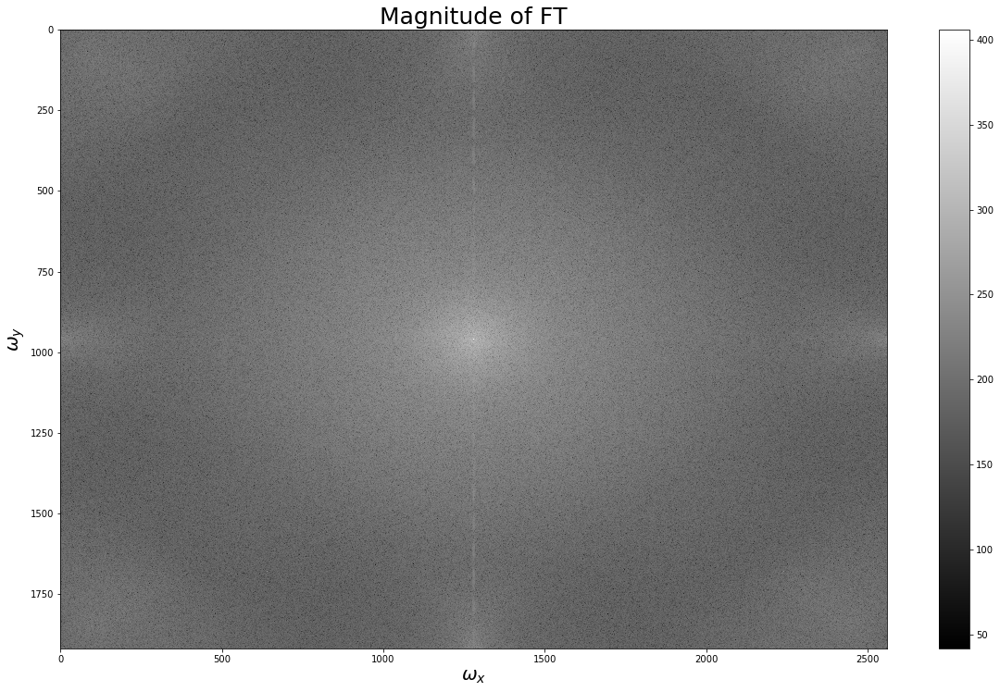

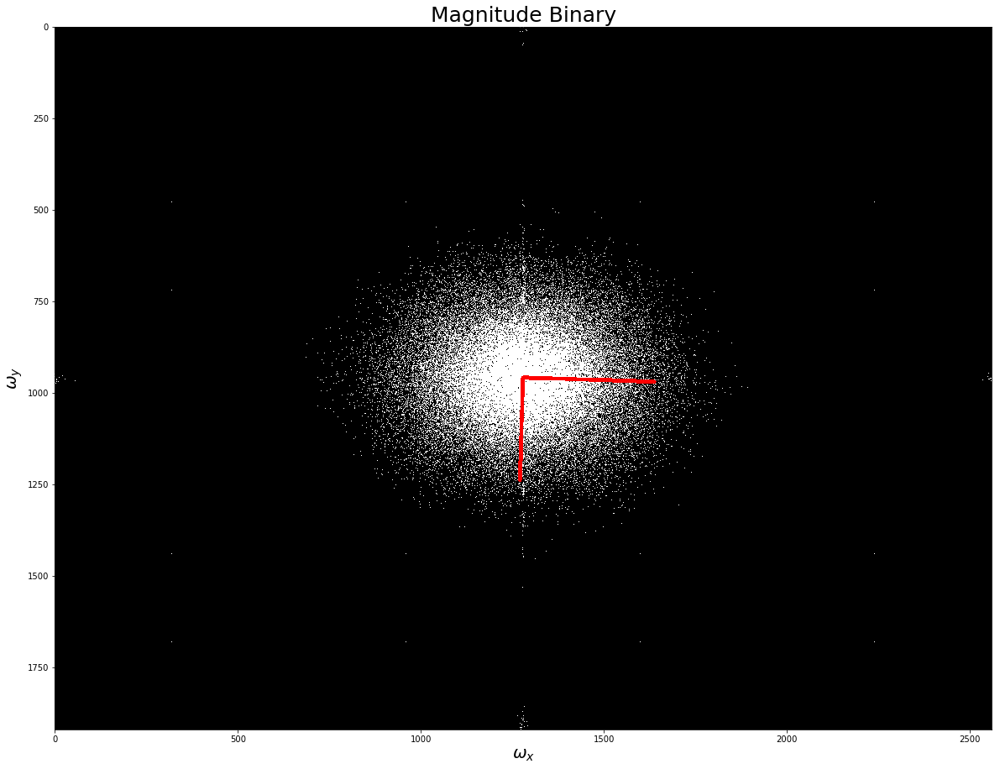

For_ANALYSIS/HMB_CB/HMB_CB_sample6.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The angle between the main component and the horizontal is 
        α = 9.961 

The angle between the second component and the horizontal is 
        β = 80.039 

The alignment factor is: 0.777


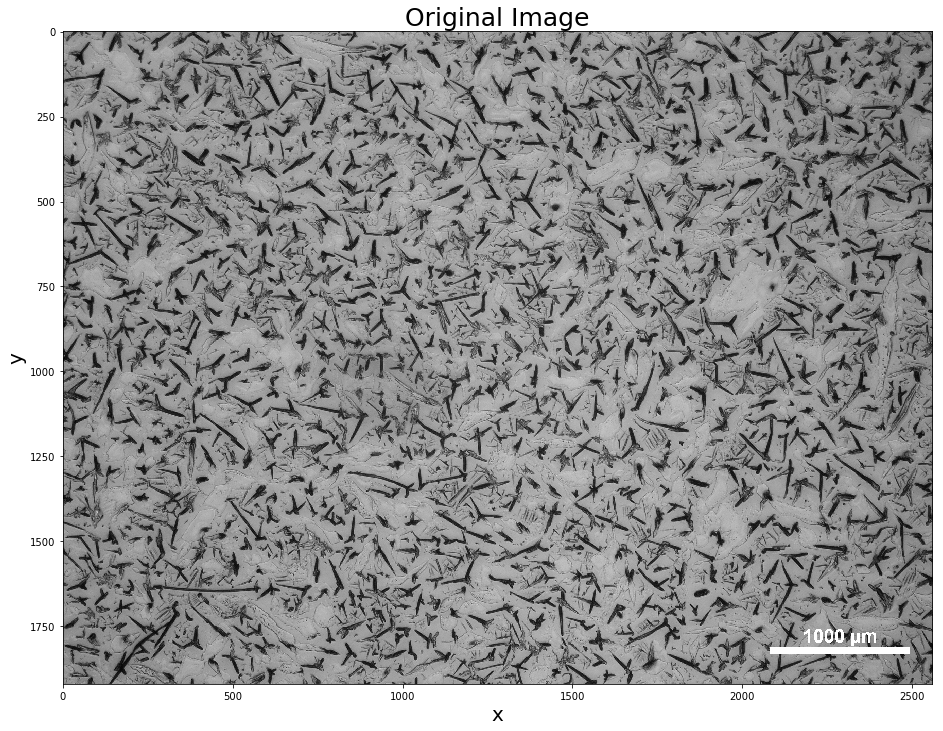

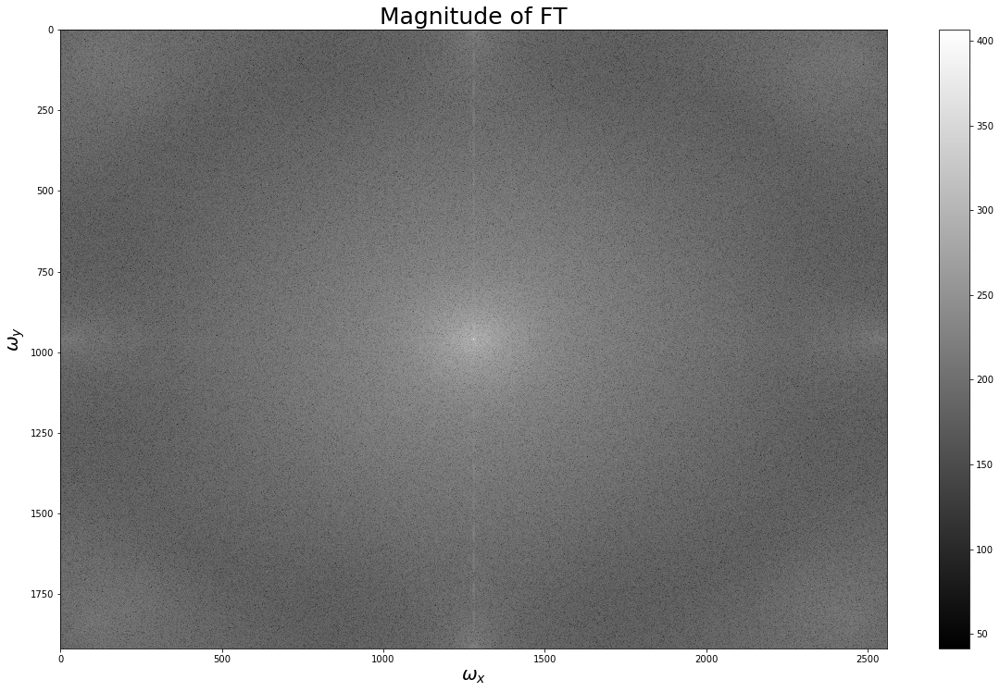

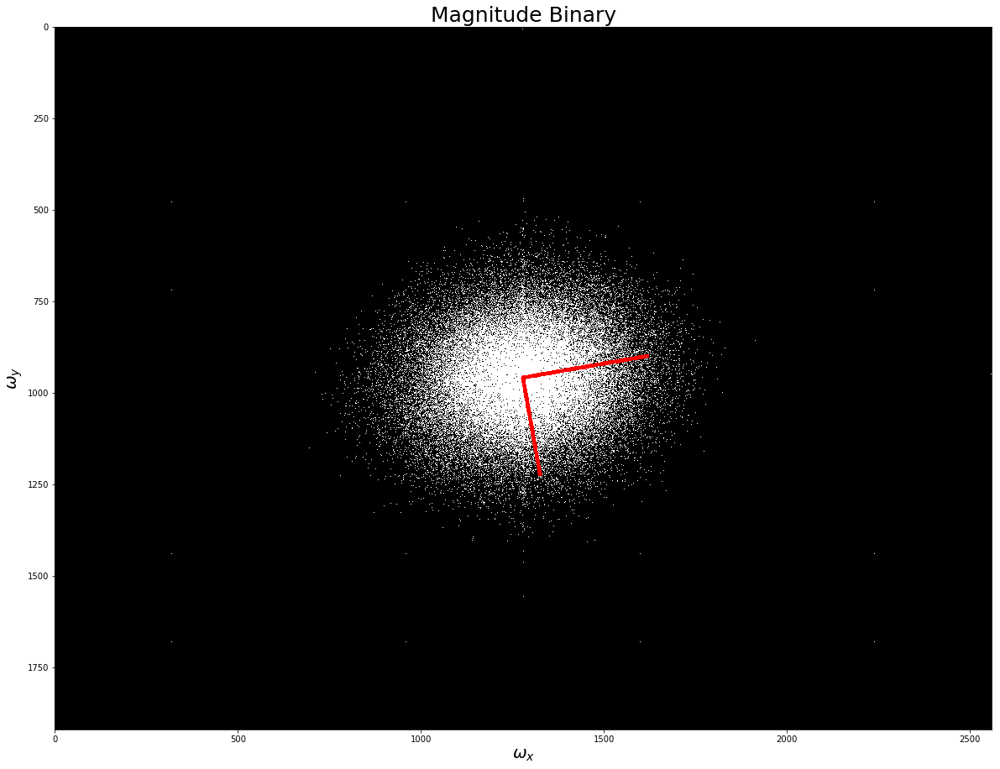

In [71]:
# first choose the folder
folder = "For_ANALYSIS/HMB_CB/"
figfolder = "figures/"

#create folders if they do not exist already:
if not os.path.exists(folder + figfolder):
    os.makedirs(folder + figfolder)
    
AlignVec = np.ones(50)

#runs over all .jpg files in the folder:
for item in glob.glob(folder + "*.jpg"):
    #extracting the number of the measurement, the channel and tha name:
    #name, chanNum, measNum = hf.FindChanAndMeas(folder, item)
    
    print(item)
    
    idx = [i for i in range(len(item)) if item[i] == '/']
    name = item[idx[0]+1:np.max(idx)]
    
    idxup = item.find("sample")
    idxdown = item.find(".")
    sampleNum = item[idxup+6 : idxdown]
    if (len(sampleNum) > 2): sampleNum = sampleNum[0]
    
    alignFact,_ = find_main_component_dft(item, 3)
    
    AlignVec[int(sampleNum)-1] = alignFact
    

In [72]:
dill.dump_session('notebook_' + name + '.db')

In [73]:
if 'name' not in globals():
    name = "135TCB_CB" # choose the name if you did not run the previous cells
    
dill.load_session('notebook_' + name + '.db')

tempdf = pickle.load(open('AlignmentDataFrames.p','rb'))

In [74]:
tempdf[name]['Alignment'] = AlignVec[0:len(tempdf[name]['GapSize'])]

adf = tempdf[name]

In [75]:
print(adf)

sortedadf = adf.sort_values('Alignment')
print('\n\nAnd the winner is...\n')
print(sortedadf)

#best = adf.loc[adf['Alignment'] == np.min(adf['Alignment'])]
#print('\n\nAnd the winner is...\n')
#print(best)
#minVec = np.array(adf['Alignment'])
#minVec = np.delete(minVec, np.where(minVec == np.min(minVec)))
#second = adf.loc[adf['Alignment'] == np.min(minVec)]
#print('\n\nSecond place to\n')
#print(second)

#minVec = np.delete(minVec, np.where(minVec == np.min(minVec)))
#third = adf.loc[adf['Alignment'] == np.min(minVec)]
#print('\n\nThird place to\n')
#print(third)

   GapSize  InkAmount  Speed  Alignment
0       30         50    0.1   0.794473
1       30         50    0.1   0.824413
2       15         50    0.1   0.822914
3       15         50    0.1   0.810740
4       15         75    0.1   0.776677
5       15         75    0.1   0.776652


And the winner is...

   GapSize  InkAmount  Speed  Alignment
5       15         75    0.1   0.776652
4       15         75    0.1   0.776677
0       30         50    0.1   0.794473
3       15         50    0.1   0.810740
2       15         50    0.1   0.822914
1       30         50    0.1   0.824413


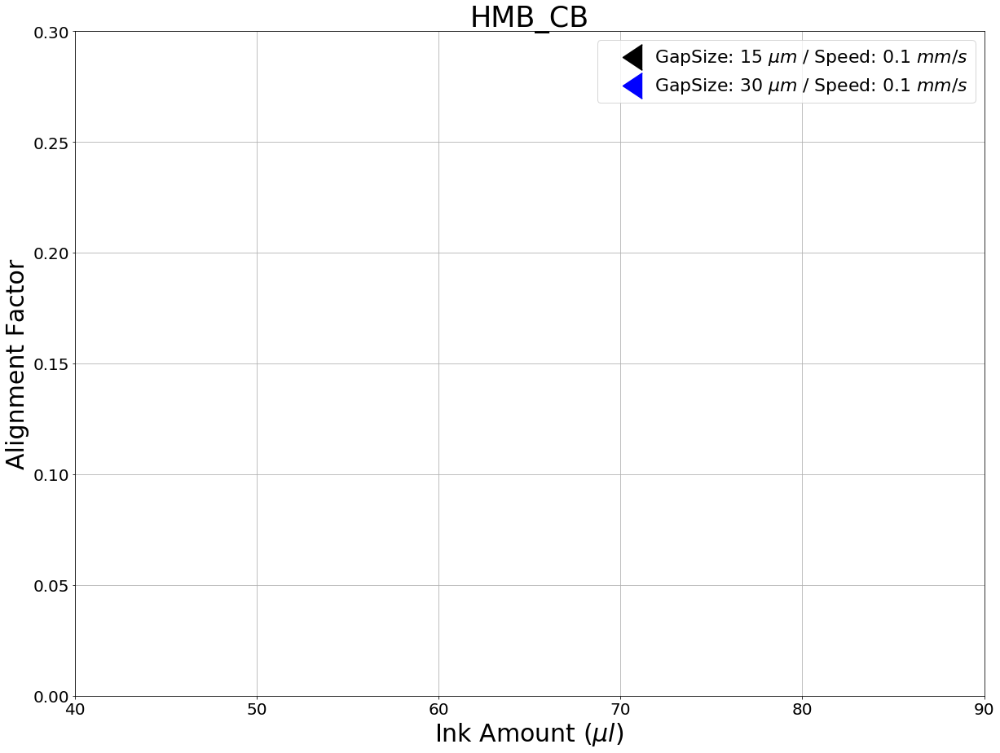

In [76]:
colors = ['k', 'b', 'r', 'c', 'm', 'y', 'k', 'b', 'g']
markers = ['1', '2', '3', '4', 'x', '+']
markers = ['.', 'o', 'x', '+']
markers = ['1',5,'2','*']
markers = [4,5,6,7]
#markers = [8,9,10,11]

labels = []
i = 0
align = np.array(adf['Alignment'])
gapsize = np.array(adf['GapSize'])
gapsize = np.delete(gapsize, np.where(gapsize == 0))
inkam = np.array(adf['InkAmount'])
speed = np.array(adf['Speed'])

plt.figure(figsize=(20,15))
for gs in np.unique(gapsize):
    df = adf.loc[adf['GapSize'] == gs]
    #print(df)
    
    k = 0
    for sp in np.unique(np.array(df['Speed'])):
        #print(gs, sp)
        ndf = df.loc[df['Speed'] == sp]
        x = np.array(ndf['InkAmount'])
        y = np.array(ndf['Alignment'])
        plt.scatter(x, y, c=colors[i], marker=markers[k], s=1000)
        k += 1
        #a = 'Speed: %.3d / Ink: %.2g' % (gs, sp)
        labels.append('GapSize: %d $\mu m$ / Speed: %.2g $mm/s$' % (gs, sp))
    
    i += 1

plt.title(name, fontsize=35)
plt.xlabel('Ink Amount ($\mu l$)', fontsize=30)
plt.ylabel('Alignment Factor', fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.axis([40, 90, 0, 0.3])
plt.grid()
plt.legend(labels, fontsize=22)
plt.savefig(folder + figfolder + name + '_Ink.png')
plt.show()

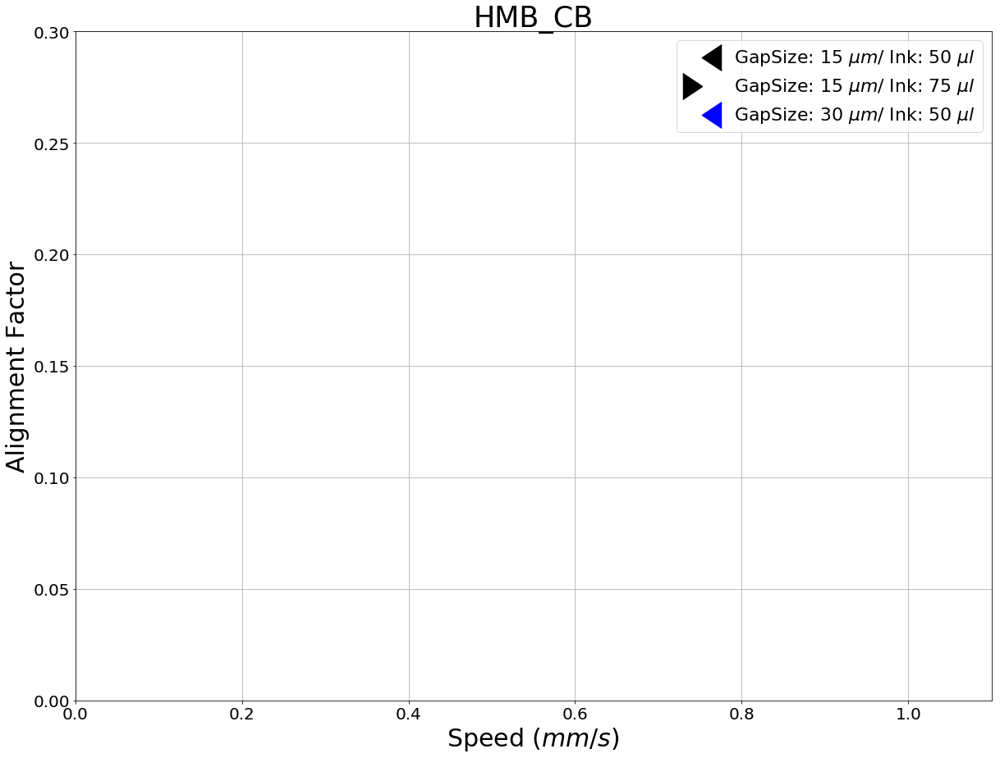

In [77]:
labels = []
i = 0
align = np.array(adf['Alignment'])
gapsize = np.array(adf['GapSize'])
gapsize = np.delete(gapsize, np.where(gapsize == 0))
inkam = np.array(adf['InkAmount'])
speed = np.array(adf['Speed'])

plt.figure(figsize=(20,15))
for gs in np.unique(gapsize):
    df = adf.loc[adf['GapSize'] == gs]
    #print(df)
    
    k = 0
    for ia in np.unique(np.array(df['InkAmount'])):
        #print(gs, ia)
        ndf = df.loc[df['InkAmount'] == ia]
        x = np.array(ndf['Speed'])
        y = np.array(ndf['Alignment'])
        plt.scatter(x, y, c=colors[i], marker=markers[k], s=1000)
        k += 1
        #a = 'Speed: %.3d / Ink: %.2g' % (gs, sp)
        labels.append('GapSize: %d $\mu m$/ Ink: %d $\mu l$' % (gs, ia))
    
    i += 1

plt.title(name, fontsize=35)
plt.xlabel('Speed ($mm/s$)', fontsize=30)
plt.ylabel('Alignment Factor', fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.axis([0, 1.1, 0, 0.3])
plt.grid()
plt.legend(labels, fontsize=22)
plt.savefig(folder + figfolder + name + '_Speed.png')
plt.show()

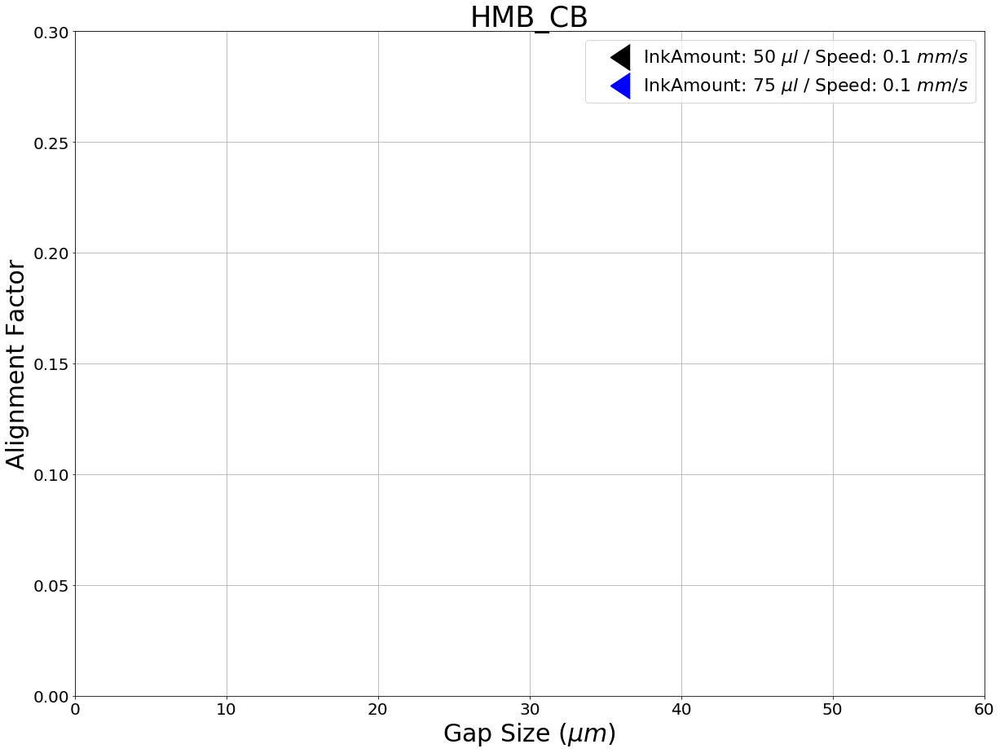

In [78]:
labels = []
i = 0
align = np.array(adf['Alignment'])
gapsize = np.array(adf['GapSize'])
gapsize = np.delete(gapsize, np.where(gapsize == 0))
inkam = np.array(adf['InkAmount'])
speed = np.array(adf['Speed'])

plt.figure(figsize=(20,15))
for ia in np.unique(inkam):
    df = adf.loc[adf['InkAmount'] == ia]
    #print(df)
    
    k = 0
    for sp in np.unique(np.array(df['Speed'])):
        #print(gs, sp)
        ndf = df.loc[df['Speed'] == sp]
        x = np.array(ndf['GapSize'])
        y = np.array(ndf['Alignment'])
        plt.scatter(x, y, c=colors[i], marker=markers[k], s=1000)
        k += 1
        #a = 'Speed: %.3d / Ink: %.2g' % (gs, sp)
        labels.append('InkAmount: %d $\mu l$ / Speed: %.2g $mm/s$' % (ia, sp))
    
    i += 1

plt.title(name, fontsize=35)
plt.xlabel('Gap Size ($\mu m$)', fontsize=30)
plt.ylabel('Alignment Factor', fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.axis([0, 60, 0, 0.3])
plt.grid()
plt.legend(labels, fontsize=22)
plt.savefig(folder + figfolder + name + '_Gap.png')
plt.show()